In [4]:
dir_anno = "VOCtrainval_11-May-2012/VOCdevkit/VOC2012/Annotations"
img_dir  = "VOCtrainval_11-May-2012/VOCdevkit/VOC2012/JPEGImages"

In [ ]:
#Lets look af the downloaded data using linux command. following commands first count the number of 
# files in annotations folder and the first 10 files names

In [5]:
ls $dir_anno | wc -l; ls $dir_anno | head -10

17125
2007_000027.xml
2007_000032.xml
2007_000033.xml
2007_000039.xml
2007_000042.xml
2007_000061.xml
2007_000063.xml
2007_000068.xml
2007_000121.xml
2007_000123.xml
ls: write error: Broken pipe


In [6]:
#run the same command for JPEGImages data. In total, there are 17125 xml files in Annotations folder and 17125
#jpeg files in JPEGImages folder.

In [3]:
ls $img_dir | wc -l;ls $img_dir | head -10

17125
2007_000027.jpg
2007_000032.jpg
2007_000033.jpg
2007_000039.jpg
2007_000042.jpg
2007_000061.jpg
2007_000063.jpg
2007_000068.jpg
2007_000121.jpg
2007_000123.jpg
ls: write error: Broken pipe


## Understanding PASCAL VOC2012 data and preprocess data

### Understanding annotation data

#### For each image in JPEGImages folder, there is a corresponding .xml file in annotation folder.


In [7]:
''' 
Having annotations information for each image in seperate files is a bit hard to work with.
we first aggregate all these xml files into a singe csv file.
1. each row of a df_anno corressponds to a single frame.
2 df_anno contains 285 columns
 width = width of the frame
 height  = height of the frame
 nobj = number of objects in the frame
 fileID = the png file name
 for each frame, there are atmost 56 objects in one frame. The informatin about the ith object is recorded
 in df_anno is :
 bb_i_nm : the type of object in bousing box i 
 bbx_i_xmin : the x coordinate of the minimum corner in bounding box i
 bbx_i_ymin : the y coordinate of the minimum corner in bounding box i
 bbx_i_xmax : the x coordinate of the maximum corner in bounding box i
 bbx_i_ymax : the y coordinate of the maximum corner in bounding box i
'''



' \nHaving annotations information for each image in seperate files is a bit hard to work with.\nwe first aggregate all these xml files into a singe csv file.\n1. each row of a df_anno corressponds to a single frame.\n2 df_anno contains 285 columns\n width = width of the frame\n height  = height of the frame\n nobj = number of objects in the frame\n fileID = the png file name\n for each frame, there are atmost 56 objects in one frame. The informatin about the ith object is recorded\n in df_anno is :\n bb_i_nm : the type of object in bousing box i \n bbx_i_xmin : the x coordinate of the minimum corner in bounding box i\n bbx_i_ymin : the y coordinate of the minimum corner in bounding box i\n bbx_i_xmax : the x coordinate of the maximum corner in bounding box i\n bbx_i_ymax : the y coordinate of the maximum corner in bounding box i\n'

In [35]:
import os
import numpy as np
import xml.etree.ElementTree as ET
from collections import OrderedDict
import matplotlib.pyplot as plt
import pandas as pd

def extract_single_xml_file(tree):
    Nobj = 0
    #print(tree)
    row = OrderedDict()
    #print(row)
    for elems in tree.iter():
        #print(elems.tag)
        if elems.tag == "size":
            #print(elems.tag)
            
            for elem in elems:
                row[elem.tag] = int(elem.text)
        
        if(elems.tag == "object"):
            for elem in elems:
                if elem.tag == "name":
                    row["bbx_{}_{}".format(Nobj, elem.tag)] = str(elem.text)
                if elem.tag == "bndbox":
                    for k in elem:
                        row["bbx_{}_{}".format(Nobj, k.tag)] = float(k.text)
                    Nobj+=1
    row["Nobj"] = Nobj
    
    return (row)

df_anno = []
#print(os.listdir(dir_anno))
for fnm in os.listdir(dir_anno):
    if not fnm.startswith('.'):  # do not include hidden folders/files
        tree = ET.parse(os.path.join(dir_anno, fnm))
        row = extract_single_xml_file(tree)
        row["fileID"] = fnm.split(".")[0]
        df_anno.append(row)
        
df_anno= pd.DataFrame(df_anno)

maxNobj = np.max(df_anno["Nobj"])

print("columns in df_anno: \n-----------------")

for icol, column in enumerate(df_anno.columns):
    print("{:3.0f}: {}".format(icol, column))
    
print("-"*30)
print("df_anno_shape = {} = (N frames, N_columns)".format(df_anno.shape))
df_anno.to_csv("dataframe_annotations.csv")

['2007_000027.xml', '2007_000032.xml', '2007_000033.xml', '2007_000039.xml', '2007_000042.xml', '2007_000061.xml', '2007_000063.xml', '2007_000068.xml', '2007_000121.xml', '2007_000123.xml', '2007_000129.xml', '2007_000170.xml', '2007_000175.xml', '2007_000187.xml', '2007_000241.xml', '2007_000243.xml', '2007_000250.xml', '2007_000272.xml', '2007_000323.xml', '2007_000332.xml', '2007_000333.xml', '2007_000346.xml', '2007_000363.xml', '2007_000364.xml', '2007_000392.xml', '2007_000423.xml', '2007_000452.xml', '2007_000464.xml', '2007_000480.xml', '2007_000491.xml', '2007_000504.xml', '2007_000515.xml', '2007_000528.xml', '2007_000529.xml', '2007_000559.xml', '2007_000572.xml', '2007_000584.xml', '2007_000629.xml', '2007_000636.xml', '2007_000645.xml', '2007_000648.xml', '2007_000661.xml', '2007_000663.xml', '2007_000664.xml', '2007_000676.xml', '2007_000713.xml', '2007_000720.xml', '2007_000727.xml', '2007_000733.xml', '2007_000738.xml', '2007_000762.xml', '2007_000783.xml', '2007_00079

columns in df_anno: 
-----------------
  0: width
  1: height
  2: depth
  3: bbx_0_name
  4: bbx_0_xmin
  5: bbx_0_ymin
  6: bbx_0_xmax
  7: bbx_0_ymax
  8: Nobj
  9: fileID
 10: bbx_1_name
 11: bbx_1_xmin
 12: bbx_1_ymin
 13: bbx_1_xmax
 14: bbx_1_ymax
 15: bbx_2_name
 16: bbx_2_xmin
 17: bbx_2_ymin
 18: bbx_2_xmax
 19: bbx_2_ymax
 20: bbx_3_name
 21: bbx_3_xmin
 22: bbx_3_ymin
 23: bbx_3_xmax
 24: bbx_3_ymax
 25: bbx_4_name
 26: bbx_4_xmin
 27: bbx_4_ymin
 28: bbx_4_xmax
 29: bbx_4_ymax
 30: bbx_5_name
 31: bbx_5_xmin
 32: bbx_5_ymin
 33: bbx_5_xmax
 34: bbx_5_ymax
 35: bbx_6_name
 36: bbx_6_xmin
 37: bbx_6_ymin
 38: bbx_6_xmax
 39: bbx_6_ymax
 40: bbx_7_name
 41: bbx_7_xmin
 42: bbx_7_ymin
 43: bbx_7_xmax
 44: bbx_7_ymax
 45: bbx_8_name
 46: bbx_8_xmin
 47: bbx_8_ymin
 48: bbx_8_xmax
 49: bbx_8_ymax
 50: bbx_9_name
 51: bbx_9_xmin
 52: bbx_9_ymin
 53: bbx_9_xmax
 54: bbx_9_ymax
 55: bbx_10_name
 56: bbx_10_xmin
 57: bbx_10_ymin
 58: bbx_10_xmax
 59: bbx_10_ymax
 60: bbx_11_name
 61

In [21]:
dir_prepocessed = "VOCtrainval_11-May-2012/VOCdevkit/VOC2012"
df_anno.to_csv(os.path.join(dir_prepocessed, "df_anno.csv"), index = False)

### Preliminary analysis

First step of developing a model is to understand the data

#### Histogram of the number of objects per image

Most of the frames contain only 1 object

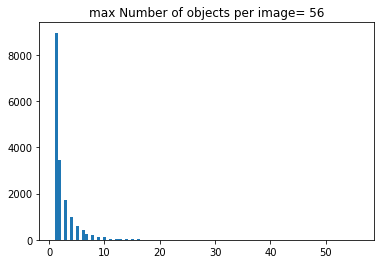

In [22]:
plt.hist(df_anno["Nobj"].values, bins = 100)
plt.title("max Number of objects per image= {}".format(maxNobj))
plt.show()

### Count the number of objects in each class for each object type

###### In total 20 objects exist.\\
###### Bar plot shows that "person" is by far the largest and there are 17401 "person" objects in the entire data

Counter({'person': 17401, 'chair': 3056, 'car': 2492, 'dog': 1598, 'bottle': 1561, 'cat': 1277, 'bird': 1271, 'pottedplant': 1202, 'sheep': 1084, 'boat': 1059, 'aeroplane': 1002, 'tvmonitor': 893, 'sofa': 841, 'bicycle': 837, 'horse': 803, 'motorbike': 801, 'diningtable': 800, 'cow': 771, 'train': 704, 'bus': 685})


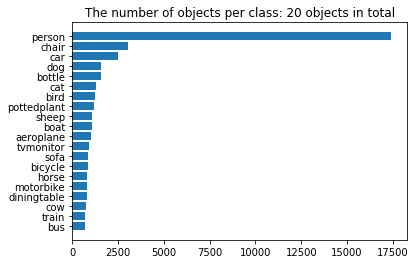

In [26]:
from collections import Counter
class_obj = []

for ibbx in range(maxNobj):
    class_obj.extend(df_anno["bbx_{}_name".format(ibbx)].values)
class_obj = np.array(class_obj)

count = Counter(class_obj[class_obj != 'nan'])
print(count)
class_nm = list(count.keys())
class_count = list(count.values())
asort_class_count = np.argsort(class_count)

class_nm = np.array(class_nm)[asort_class_count]
class_count = np.array(class_count)[asort_class_count]

xs = range(len(class_count))
plt.barh(xs, class_count)
plt.yticks(xs, class_nm)
plt.title("The number of objects per class: {} objects in total".format(len(count)))
plt.show()

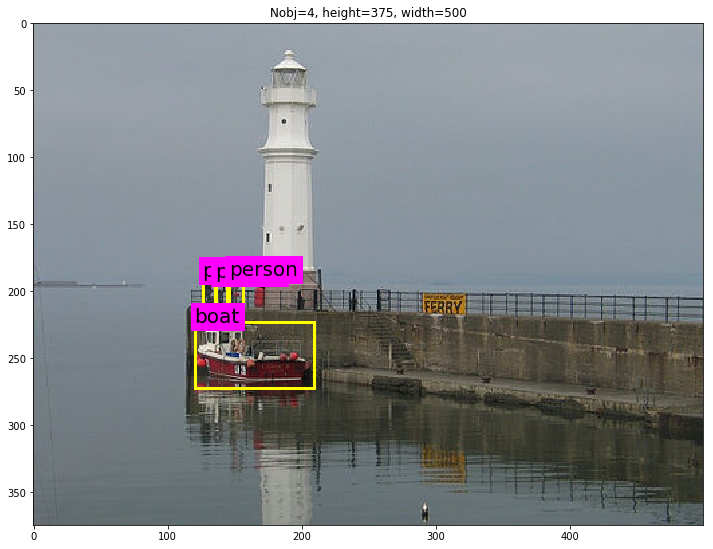

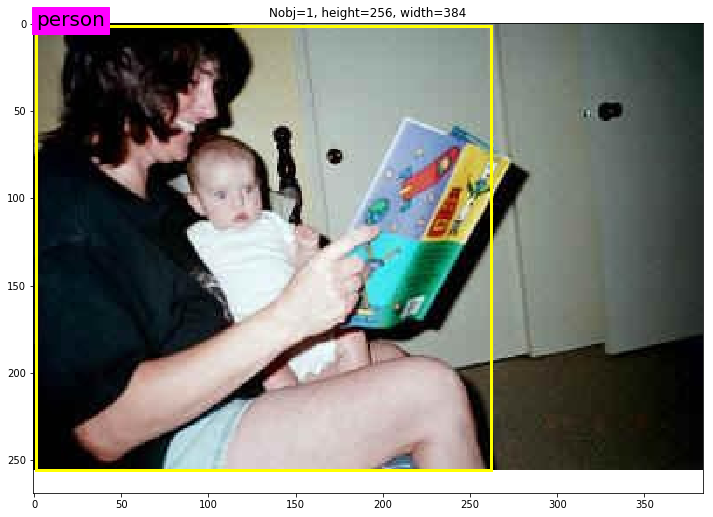

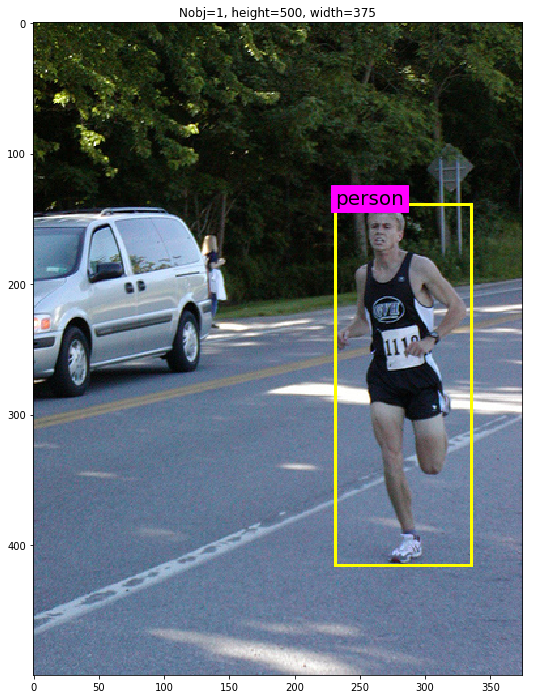

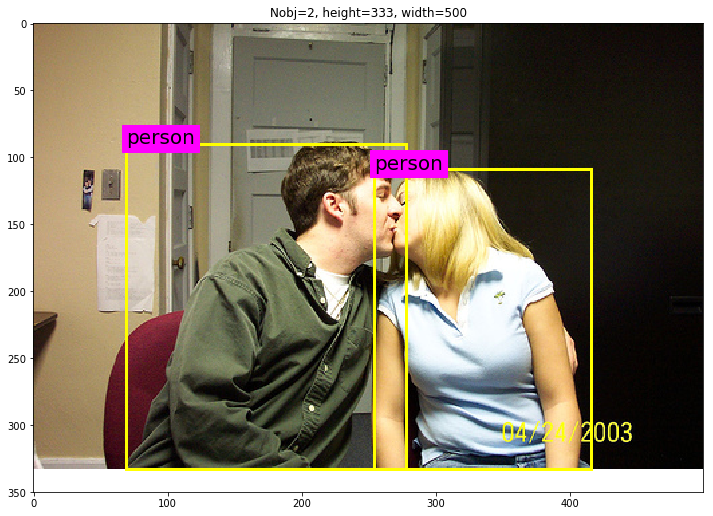

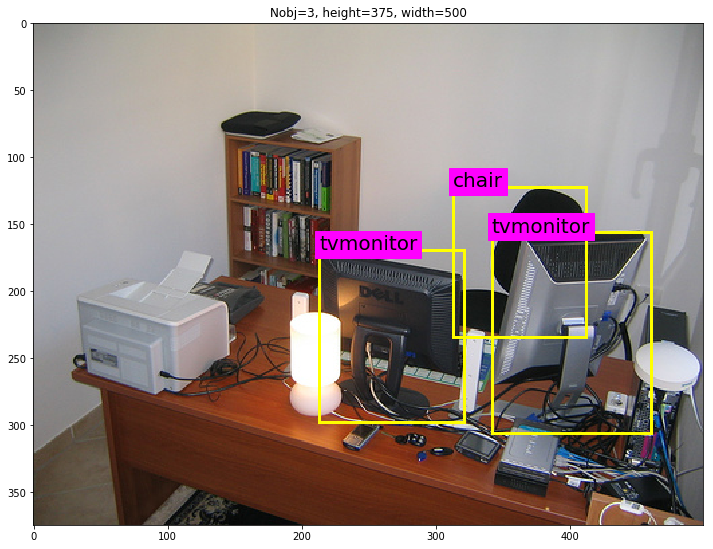

...

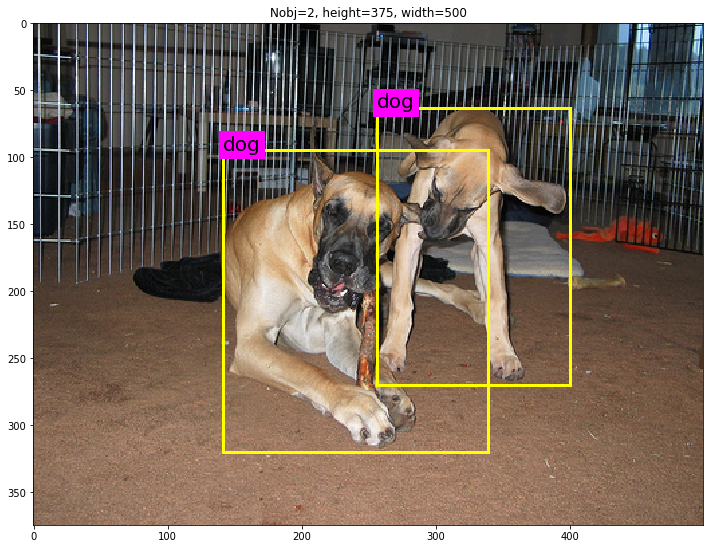

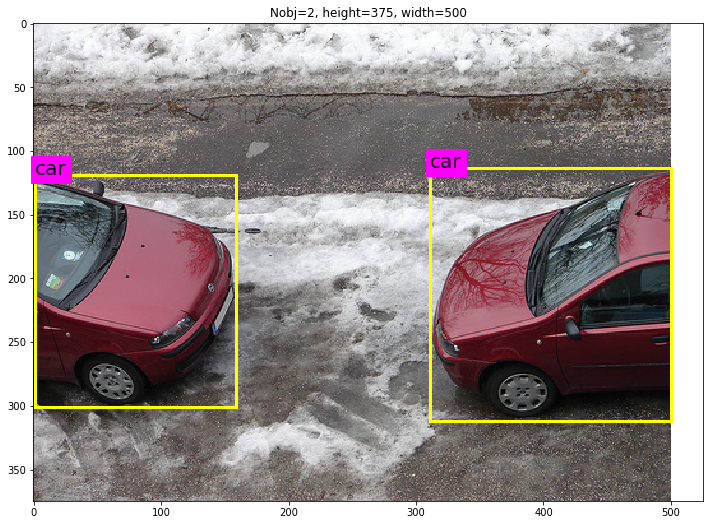

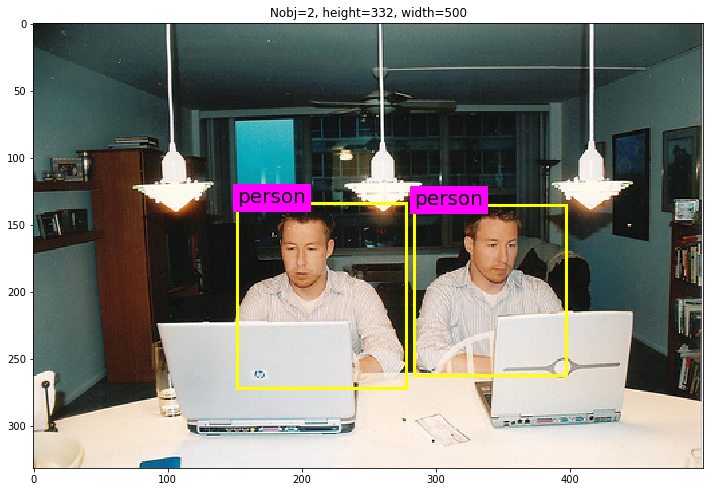

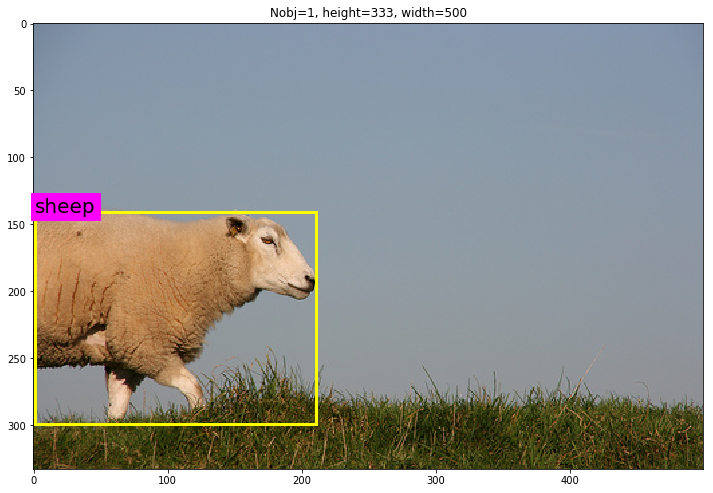

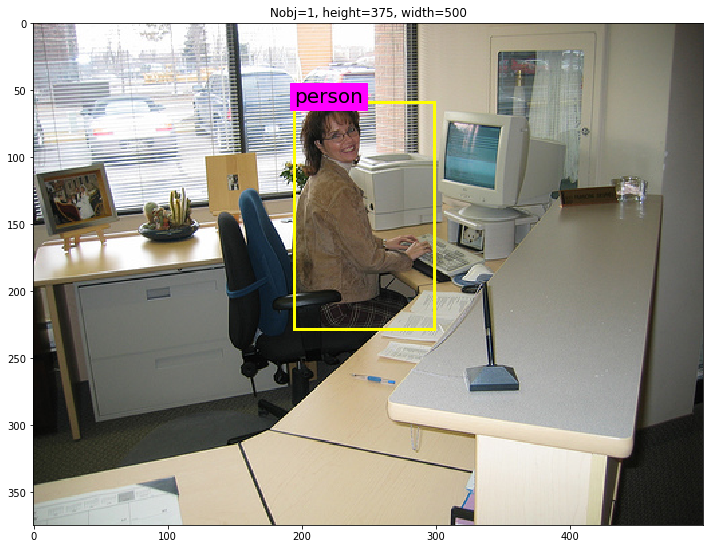

In [28]:
import imageio
def plt_rectangle(plt,label,x1,y1,x2,y2):
    '''
    == Input ==
    
    plt   : matplotlib.pyplot object
    label : string containing the object class name
    x1    : top left corner x coordinate
    y1    : top left corner y coordinate
    x2    : bottom right corner x coordinate
    y2    : bottom right corner y coordinate
    '''
    linewidth = 3
    color = "yellow"
    plt.text(x1,y1,label,fontsize=20,backgroundcolor="magenta")
    plt.plot([x1,x1],[y1,y2], linewidth=linewidth,color=color)
    plt.plot([x2,x2],[y1,y2], linewidth=linewidth,color=color)
    plt.plot([x1,x2],[y1,y1], linewidth=linewidth,color=color)
    plt.plot([x1,x2],[y2,y2], linewidth=linewidth,color=color)
    
# randomly select 20 frames    
size = 20    
ind_random = np.random.randint(0,df_anno.shape[0],size=size)
for irow in ind_random:
    row  = df_anno.iloc[irow,:]
    path = os.path.join(img_dir, row["fileID"] + ".jpg")
    # read in image
    img  = imageio.imread(path)

    plt.figure(figsize=(12,12))
    plt.imshow(img) # plot image
    plt.title("Nobj={}, height={}, width={}".format(row["Nobj"],row["height"],row["width"]))
    # for each object in the image, plot the bounding box
    
    for iplot in range(row["Nobj"]):
        plt_rectangle(plt,
                      label = row["bbx_{}_name".format(iplot)],
                      x1=row["bbx_{}_xmin".format(iplot)],
                      y1=row["bbx_{}_ymin".format(iplot)],
                      x2=row["bbx_{}_xmax".format(iplot)],
                      y2=row["bbx_{}_ymax".format(iplot)])
    plt.show() ## show the plot